# Compare masks to cell segmentation

        CosMx cell segmentation
        CosMX GRIDGENE masks

        Xenium cell segmentation
        Xenium GRIDGENE masks

This notebook intends to provide a Quantitative Validation of Compartment Masks. For this,  we align GRIDGENE-generated cancer and stroma masks across CosMx and Xenium platforms comparing these masks to orthogonal cell segmentation & orthogonal annotations. 

In [1]:
# %load_ext autoreload
# %autoreload 2

# import os 
# import sys
# import time
# import logging
# import re
# from tqdm import tqdm
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from PIL import Image
# from natsort import natsorted
# import json

# import cv2
# import numpy as np
# from PIL import Image
# import tifffile as tiff
# import copy 
# import random
# from natsort import natsorted
# import sys
# from pathlib import Path
# import re
# from shapely.geometry import Polygon

# # Add GRIDGENE root to path
# # You need to go up 2 levels
# gridgene_root = Path.cwd().parent.parent  # analyses/quantification -> analyses -> GRIDGENE
# sys.path.insert(0, str(gridgene_root))

# print(f"Added to path: {gridgene_root}")
# print(f"gridgene package location: {gridgene_root / 'gridgene'}")
# from gridgene import get_arrays as ga
# from gridgene import contours 
# from gridgene import get_masks
      
# import scanpy as sc
  

# import sys
# from pathlib import Path
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import tifffile
# import cv2
# from tqdm import tqdm

# # Add GRIDGENE to path
# gridgene_root = Path.cwd().parent.parent
# sys.path.insert(0, str(gridgene_root))

# # Import GRIDGENE modules
# from gridgene import get_arrays as ga
# from gridgene import contours, get_masks

# # Import quantification modules
# sys.path.append(str(Path.cwd().parent / 'scripts'))
# from scripts.preprocessing import preprocess_if_image, register_masks_to_image
# from scripts.metrics import calculate_overlap_metrics, calculate_enrichment

# print("✓ Imports successful")
# print(f"Working directory: {Path.cwd()}")
# import pandas as pd
# import seaborn as sns
# from matplotlib.colors import ListedColormap
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.transform import resize
# from matplotlib.patches import Patch
# import tifffile
# import os
# from natsort import natsorted
# import copy
      
# from scipy import ndimage
# from skimage import morphology
# import numpy as np
# import matplotlib.pyplot as plt

# from skimage import morphology
# import cv2

%load_ext autoreload
%autoreload 2

# Standard library
import os
import sys
import re
import json
import logging
import copy
import random
import time
from pathlib import Path

# Third party
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tifffile as tiff
from PIL import Image
from tqdm import tqdm
from natsort import natsorted
from scipy import ndimage
from shapely.geometry import Polygon
from skimage.segmentation import find_boundaries
from matplotlib.patches import Patch
import scanpy as sc

# Path setup
gridgene_root = Path.cwd().parent.parent
sys.path.insert(0, str(gridgene_root))
sys.path.append(str(Path.cwd().parent / 'scripts'))
print(f"Added to path: {gridgene_root}")

# GRIDGENE modules
from gridgene import get_arrays as ga
from gridgene import contours, get_masks

# Scripts
from scripts.cell_phenotype_validation import (
    load_baysor_polygons,
    map_phenotypes_to_polygons_xenium,
)

print("✓ Imports successful")
print(f"Working directory: {Path.cwd()}")

Added to path: /home/martinha/PycharmProjects/phd/GRIDGENE
✓ Imports successful
Working directory: /home/martinha/PycharmProjects/phd/GRIDGENE/analyses/quantitative_validation


In [2]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

## CosMx 
We will start the quantitative analysis with CosMx data:
    - (1) Run gridgene pipeline
    - (2) Fetch cell segmentation (provided by Nanostring) and phenotyping.
    
Platform: CosMx (20 cores, 999 genes, IF reference)

To run the analysis more smoothly we will select 3 images from the CosMx cohort. Importantly, the overlay between both images would depend on the parametes used, meaning, depending on the degree of details, masks can become more smooth or more fine grained.

Path definition

In [3]:
# Base paths
cosmx_path_s0 = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/cosmx_data/S0/S0/20230628_151317_S4/AnalysisResults/iz38iruwno'
path_if = "/home/martinha/PycharmProjects/phd/spatial_transcriptomics/GRIDGEN/case_studies/PENGUINcomposites/"
cell_labels_base_path = Path('data')  # relative to notebook location
phenotype_csv_path = os.path.join(cell_labels_base_path,'CosMx_Slide1_S0_Annotated_Seurat_cell_labels_NanoString_segmentation.csv')
# '/home/martinha/PycharmProjects/phd/GRIDGENE/analyses/quantitative_validation/data/CosMx_Slide1_S0_Annotated_Seurat_cell_labels_NanoString_segmentation.csv'

# Define the FOVs you want
selected_fov_numbers = ['001', '005', '012']

# Build the comprehensive dictionary with all file paths
fov_data = {}
for fov_num in selected_fov_numbers:
    fov_name = f'FOV{fov_num}'
    cosmx_folder = os.path.join(cosmx_path_s0, fov_name)
    cosmx_file = None
    coord_file = None

    if os.path.isdir(cosmx_folder):
        for file in os.listdir(cosmx_folder):
            if '__target_call_coord.csv' in file and 'complete_code' not in file:
                cosmx_file = os.path.join(cosmx_folder, file)
            if '__complete_code_cell_target_call_coord.csv' in file:
                coord_file = os.path.join(cosmx_folder, file)

    fov_data[fov_name] = {
        'cosmx_path': cosmx_file,
        'coord_path': coord_file,
        'if_path': os.path.join(path_if, f"20230628_151317_S4_C902_P99_N99_F{fov_num}_composite.tiff"),
        'cell_labels_path': cell_labels_base_path / fov_name / f'CellLabels_F{fov_num}.tif',
        'comp_labels_path': cell_labels_base_path / fov_name / f'CompartmentLabels_F{fov_num}.tif',
    }

### 1.1 Run gridgene

In [4]:
def do_cosmx_pipeline(file_csv, target_tum, 
                     kernel_size_tum, density_th_tum, min_area_th_tum,
                     kernel_size_empty, density_th_empty, min_area_th_empty,
                     plot=False):
    """
    Generate GRIDGENE masks from CosMx CSV file
    
    Returns:
    --------
    dict: Contains masks and metadata
        - 'mask_tumor': tumor mask
        - 'mask_stroma': stroma mask  
        - 'mask_empty': empty mask
        - 'height': image height
        - 'width': image width
        - 'fov': FOV identifier
        - 'filename': input CSV filename
    """
    
    # Load and prepare data
    df_total = pd.read_csv(file_csv)
    df_total['X'] = (round(df_total['x'])).astype(int)
    df_total['Y'] = (round(df_total['y'])).astype(int)
    
    height = max(df_total['X']) + 1
    width = max(df_total['Y']) + 1
    
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    
    # Create array
    array_total = ga.transform_df_to_array(
        df=df_total, 
        target_dict=target_dict_total, 
        array_shape=(height, width, len(target_dict_total))
    ).astype(np.int8)
    
    # Subset for tumor markers
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(
        df_total, array_total, target_dict_total,
        target_list=target_tum, target_col='target'
    )
    
    # Tumor contours
    CTum = contours.ConvolutionContours(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(
        density_threshold=density_th_tum,
        min_area_threshold=min_area_th_tum,
        directionality='higher'
    )
    
    # Empty region contours
    CEmpty = contours.ConvolutionContours(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(
        density_threshold=density_th_empty,
        min_area_threshold=min_area_th_empty,
        directionality='lower'
    )
    
    # Create masks
    GM = get_masks.GetMasks(image_shape=(height, width))
    
    mask_empty = GM.create_mask(CEmpty.contours)
    mask_tum = GM.create_mask(CTum.contours)
    mask_tum = GM.fill_holes(mask_tum)
    mask_stroma = GM.subtract_masks(
        np.ones((height, width), dtype=np.uint8), 
        mask_tum, 
        mask_empty
    )
    mask_stroma = GM.filter_binary_mask_by_area(mask_stroma, min_area=700)
    
    # Extract FOV identifier from filename
    # e.g., "FOV001_..." -> "FOV001"
    basename = os.path.basename(file_csv)
    fov_match = re.search(r'FOV\d{3}', basename)
    fov = fov_match.group(0) if fov_match else basename.split('_')[0]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        
        CTum.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[0]
        )
        axs[0].set_title(f'{fov}: Tumor Contours')
        
        CEmpty.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[1]
        )
        axs[1].set_title(f'{fov}: Empty Region Contours')
        
        GM.plot_masks(
            masks=[mask_stroma, mask_tum], 
            mask_names=['Stroma', 'Tumor'],
            background_color=(1, 1, 1), 
            mask_colors={'Stroma': (65, 105, 225), 'Tumor': (255, 165, 0)},
            path=None, show=False, ax=axs[2]
        )
        axs[2].set_title(f'{fov}: Final Masks')
        
        plt.tight_layout()
        plt.show()
    
    # Return dictionary with all info
    return {
        'mask_tumor': mask_tum,
        'mask_stroma': mask_stroma,
        'mask_empty': mask_empty,
        'height': height,
        'width': width,
        'fov': fov,
        'filename': file_csv
    }

print("GRIDGENE pipeline function defined (returns dict)")

GRIDGENE pipeline function defined (returns dict)



Processing FOV001...


2026-03-13 23:58:48,874 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-13 23:58:49,377 - gridgene.contours.tum - INFO - get_conv_sum took 0.5023 seconds
2026-03-13 23:58:49,727 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 38
2026-03-13 23:58:49,728 - gridgene.contours.tum - INFO - contours_from_sum took 0.3507 seconds
2026-03-13 23:58:49,728 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-13 23:58:58,620 - gridgene.contours.empty - INFO - get_conv_sum took 8.8911 seconds
2026-03-13 23:59:07,315 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 35
2026-03-13 23:59:07,316 - gridgene.contours.empty - INFO - contours_from_sum took 8.6955 seconds
2026-03-13 23:59:07,316 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-13 23:59:07,339 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


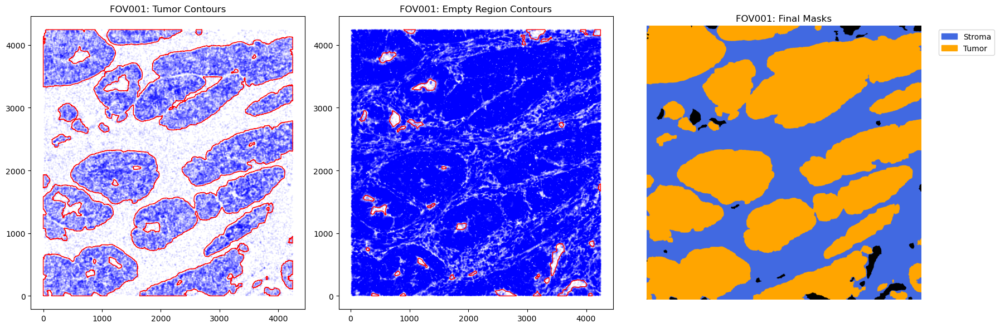

 Completed FOV001

Processing FOV005...


2026-03-13 23:59:25,708 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-13 23:59:26,196 - gridgene.contours.tum - INFO - get_conv_sum took 0.4876 seconds
2026-03-13 23:59:26,515 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 22
2026-03-13 23:59:26,516 - gridgene.contours.tum - INFO - contours_from_sum took 0.3189 seconds
2026-03-13 23:59:26,516 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-13 23:59:35,204 - gridgene.contours.empty - INFO - get_conv_sum took 8.6876 seconds
2026-03-13 23:59:43,736 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 71
2026-03-13 23:59:43,736 - gridgene.contours.empty - INFO - contours_from_sum took 8.5316 seconds
2026-03-13 23:59:43,737 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-13 23:59:43,760 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


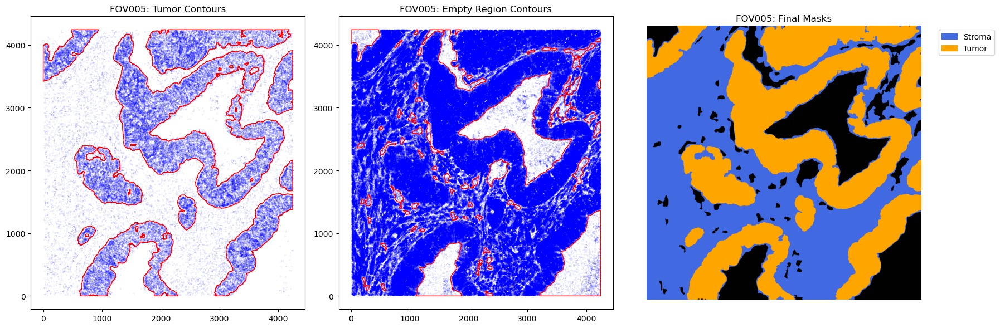

 Completed FOV005

Processing FOV012...


2026-03-14 00:00:02,510 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-14 00:00:02,984 - gridgene.contours.tum - INFO - get_conv_sum took 0.4731 seconds
2026-03-14 00:00:03,306 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 45
2026-03-14 00:00:03,307 - gridgene.contours.tum - INFO - contours_from_sum took 0.3230 seconds
2026-03-14 00:00:03,308 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-14 00:00:12,104 - gridgene.contours.empty - INFO - get_conv_sum took 8.7958 seconds
2026-03-14 00:00:20,700 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 36
2026-03-14 00:00:20,700 - gridgene.contours.empty - INFO - contours_from_sum took 8.5963 seconds
2026-03-14 00:00:20,701 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-14 00:00:20,725 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


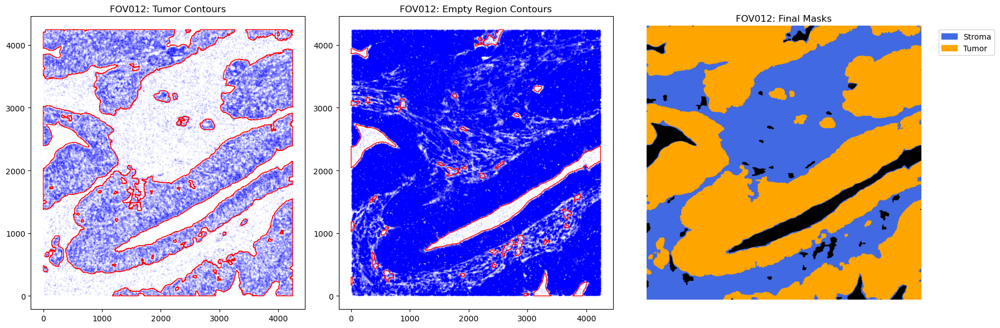

 Completed FOV012
FOV001: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)
FOV005: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)
FOV012: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)


In [5]:
############## DEFINE PARAMETERS ##################

# param cancer
target_tum =  ['EPCAM',  'KRT19', 'KRT8', 'KRT18','KRT17','CEACAM6','SPINK1', 'CD24', 'S100A6','RPL37','S100P',]  
density_th_tum = 40    
min_area_th_tum =  1000 
kernel_size_tum = 80

# param empty
density_th_empty = 140
min_area_th_empty = 2000 
kernel_size_empty = 80

############# RUN GRIDGENE ###################
cosmx_results = []
for fov_name, paths in fov_data.items():
    print(f"\nProcessing {fov_name}...")
    
    result = do_cosmx_pipeline(
        paths['cosmx_path'],
        target_tum, 
        kernel_size_tum, density_th_tum, min_area_th_tum,
        kernel_size_empty, density_th_empty, min_area_th_empty,
        plot=True
    )

    result['fov'] = fov_name
    result['if_path'] = paths['if_path']
    
    cosmx_results.append(result)
    print(f" Completed {fov_name}")

for result in cosmx_results:
    print(f"{result['fov']}: Tumor mask {result['mask_tumor'].shape}, Stroma mask {result['mask_stroma'].shape},Empty mask {result['mask_empty'].shape}")

### 2.1. Compare GRIDGENE masks with cell segmentation 

In [6]:
COLORS_RGB = {'Epithelial': (255, 0, 0), 'Stromal': (0, 0, 255), 'Immune': (0, 200, 0)}
COLORS_MPL = {'tumor': '#e74c3c', 'stroma': '#3498db', 'empty': '#95a5a6'}
OUTPUT_DIR = 'figures/cosmx'
os.makedirs(OUTPUT_DIR, exist_ok=True)

LABEL_GROUPS = {
    'Epithelial cells': 'Epithelial',
    'Stromal cells': 'Stromal',
    'T cells': 'Immune', 'Myeloid cells': 'Immune',
    'Plasma cells': 'Immune', 'Other cells': 'Immune', 'Granolocytes': 'Immune'
}
COLOR_MAP = {'Epithelial': [1,0,0], 'Stromal': [0,0,1], 'Immune': [0,1,0]}

pheno_df = pd.read_csv(phenotype_csv_path)
pheno_df['fov_num'] = pheno_df['Cells'].str.split('_').str[2].astype(int)
pheno_df['cell_id'] = pheno_df['Cells'].str.split('_').str[3].astype(int)
pheno_df['group'] = pheno_df['Final_label'].map(LABEL_GROUPS)

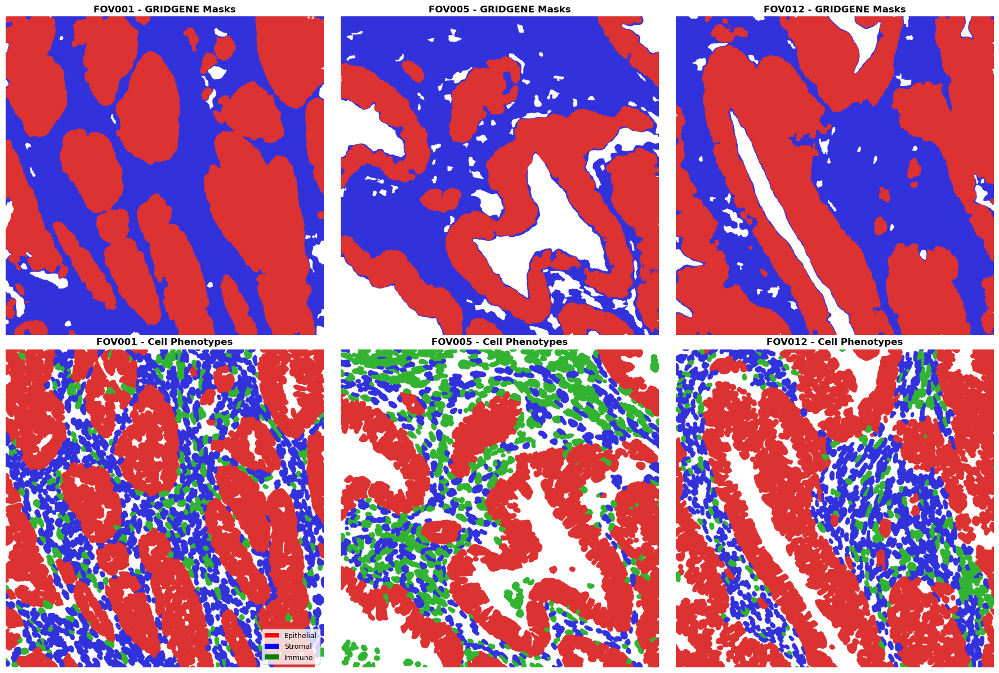

In [7]:
n = len(cosmx_results)
fig, axes = plt.subplots(2, n, figsize=(6*n, 12))

color_map = {'Epithelial': (220, 50, 50), 'Stromal': (50, 50, 220), 'Immune': (50, 180, 50)}

for idx, result in enumerate(cosmx_results):
    fov_name = result['fov']
    fov_num = int(fov_name.replace('FOV', ''))
    mask_tumor = result['mask_tumor']
    mask_stroma = result['mask_stroma']
    h, w = mask_tumor.shape

    # Row 1: GRIDGENE masks
    gg_rgb = np.ones((h, w, 3), dtype=np.uint8) * 255
    gg_rgb[mask_tumor == 1] = (220, 50, 50)
    gg_rgb[mask_stroma == 1] = (50, 50, 220)
    axes[0, idx].imshow(gg_rgb)
    axes[0, idx].set_title(f'{fov_name} - GRIDGENE Masks', fontweight='bold')
    axes[0, idx].axis('off')

    # Row 2: Cell phenotypes - vectorized, no per-cell loop
    cell_labels = tiff.imread(fov_data[fov_name]['cell_labels_path'])
    cell_labels = np.rot90(np.flipud(cell_labels), -1)[:h, :w]
    pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'group']].dropna()

    cell_rgb = np.ones((h, w, 3), dtype=np.uint8) * 255
    # Build lookup array: cell_id -> color
    max_id = cell_labels.max() + 1
    lut = np.ones((max_id, 3), dtype=np.uint8) * 255
    for _, row in pheno_fov.iterrows():
        lut[row['cell_id']] = color_map.get(row['group'], (128, 128, 128))
    cell_rgb = lut[cell_labels]

    axes[1, idx].imshow(cell_rgb)
    axes[1, idx].set_title(f'{fov_name} - Cell Phenotypes', fontweight='bold')
    axes[1, idx].axis('off')

legend = [Patch(facecolor='red', label='Epithelial'),
          Patch(facecolor='blue', label='Stromal'),
          Patch(facecolor='green', label='Immune')]
axes[1, 0].legend(handles=legend, loc='lower right', fontsize=9)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/cosmx_overview.png', dpi=300, bbox_inches='tight')
plt.show()

Map cells to gridgene masks

In [8]:
# def map_cells_to_gridgene_masks(fov_data, pheno_df, cosmx_results):
#     """
#     For each FOV, compute cell centroids from coord file,
#     join with phenotypes, and assign each cell to a GRIDGENE mask.
#     """
#     # Prepare phenotype df
#     pheno_df['fov_num'] = pheno_df['Cells'].str.split('_').str[2].astype(int)
#     pheno_df['cell_id'] = pheno_df['Cells'].str.split('_').str[3].astype(int)
    
#     # Build gridgene masks lookup by fov_name
#     gg_by_fov = {r['fov']: r for r in cosmx_results}
    
#     all_results = []
    
#     for fov_name, paths in fov_data.items():
#         fov_num = int(fov_name.replace('FOV', ''))
#         print(f"{fov_name}...", end=" ")
        
#         # Load coord file and compute centroids
#         coord_df = pd.read_csv(paths['coord_path'])
#         centroids = coord_df[coord_df['CellId'] > 0].groupby('CellId')[['x','y']].mean().reset_index()
        
#         # Filter phenotypes for this FOV
#         pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'Final_label']]
        
#         # Join
#         merged = centroids.merge(pheno_fov, left_on='CellId', right_on='cell_id', how='inner')
#         merged['group'] = merged['Final_label'].map(LABEL_GROUPS)  # <-- fix

#         print(f"{len(merged)} cells with phenotypes", end=" ")
        
#         # Get GRIDGENE masks
#         gg = gg_by_fov[fov_name]
#         mask_tumor = gg['mask_tumor']
#         mask_stroma = gg['mask_stroma']
#         mask_empty = gg['mask_empty']
        
#         # Assign each cell to a mask based on centroid
#         def get_compartment(x, y):
#             xi, yi = int(round(x)), int(round(y))
#             # bounds check
#             if xi < 0 or yi < 0 or xi >= mask_tumor.shape[0] or yi >= mask_tumor.shape[1]:
#                 return 'outside'
#             if mask_tumor[xi, yi] == 1:
#                 return 'tumor'
#             elif mask_stroma[xi, yi] == 1:
#                 return 'stroma'
#             elif mask_empty[xi, yi] == 1:
#                 return 'empty'
#             return 'unassigned'
        
#         merged['gridgene_compartment'] = merged.apply(lambda r: get_compartment(r['x'], r['y']), axis=1)
#         merged['fov'] = fov_name
#         all_results.append(merged)
#         print(f"✓")
    
#     return pd.concat(all_results, ignore_index=True)

# cell_df = map_cells_to_gridgene_masks(fov_data, pheno_df, cosmx_results)
# print(cell_df['gridgene_compartment'].value_counts())
# print(cell_df['Final_label'].value_counts())
# print(pd.crosstab(cell_df['Final_label'], cell_df['gridgene_compartment'], normalize='index').round(2))

# per majority of the pixels iinstead of per centroid 
def map_cells_to_gridgene_masks_pixel(fov_data, pheno_df, cosmx_results):
    pheno_df['fov_num'] = pheno_df['Cells'].str.split('_').str[2].astype(int)
    pheno_df['cell_id'] = pheno_df['Cells'].str.split('_').str[3].astype(int)
    
    gg_by_fov = {r['fov']: r for r in cosmx_results}
    all_results = []
    
    for fov_name, paths in fov_data.items():
        fov_num = int(fov_name.replace('FOV', ''))
        print(f"{fov_name}...", end=" ")
        
        gg = gg_by_fov[fov_name]
        mask_tumor = gg['mask_tumor']
        mask_stroma = gg['mask_stroma']
        mask_empty = gg['mask_empty']
        h, w = mask_tumor.shape

        # Load cell label TIFF
        cell_labels = tiff.imread(fov_data[fov_name]['cell_labels_path'])
        cell_labels = np.rot90(np.flipud(cell_labels), -1)[:h, :w]

        # Vectorized pixel overlap per cell
        max_id = cell_labels.max() + 1
        tumor_pixels  = np.bincount(cell_labels.ravel(), weights=mask_tumor.ravel(),  minlength=max_id)
        stroma_pixels = np.bincount(cell_labels.ravel(), weights=mask_stroma.ravel(), minlength=max_id)
        empty_pixels  = np.bincount(cell_labels.ravel(), weights=mask_empty.ravel(),  minlength=max_id)

        def get_compartment(cid):
            t, s, e = tumor_pixels[cid], stroma_pixels[cid], empty_pixels[cid]
            if t == 0 and s == 0 and e == 0:
                return 'unassigned'
            return max([('tumor', t), ('stroma', s), ('empty', e)], key=lambda x: x[1])[0]

        # Phenotypes
        pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'Final_label']]
        pheno_fov = pheno_fov.copy()
        pheno_fov['group'] = pheno_fov['Final_label'].map(LABEL_GROUPS)
        pheno_fov['gridgene_compartment'] = pheno_fov['cell_id'].apply(get_compartment)
        pheno_fov['fov'] = fov_name

        all_results.append(pheno_fov)
        print(f"{len(pheno_fov)} cells ✓")
    
    return pd.concat(all_results, ignore_index=True)

cell_df = map_cells_to_gridgene_masks_pixel(fov_data, pheno_df, cosmx_results)
print(cell_df['gridgene_compartment'].value_counts())
print(pd.crosstab(cell_df['Final_label'], cell_df['gridgene_compartment'], normalize='index').round(2))

FOV001... 2714 cells ✓
FOV005... 2084 cells ✓
FOV012... 2871 cells ✓
gridgene_compartment
tumor     4368
stroma    3197
empty      104
Name: count, dtype: int64
gridgene_compartment  empty  stroma  tumor
Final_label                               
Epithelial cells       0.00    0.03   0.97
Granolocytes           0.05    0.84   0.11
Myeloid cells          0.01    0.97   0.02
Other cells            0.72    0.13   0.15
Plasma cells           0.01    0.99   0.00
Stromal cells          0.01    0.94   0.05
T cells                0.01    0.84   0.14


In [9]:
df = cell_df[cell_df['gridgene_compartment'].isin(['tumor', 'stroma'])].copy()
df['correct'] = ((df['group'] == 'Epithelial') & (df['gridgene_compartment'] == 'tumor')) | \
                ((df['group'] != 'Epithelial') & (df['gridgene_compartment'] == 'stroma'))
concordance = df['correct'].sum() / len(df) * 100
print(f"Overall concordance: {concordance:.1f}%")

Overall concordance: 96.0%


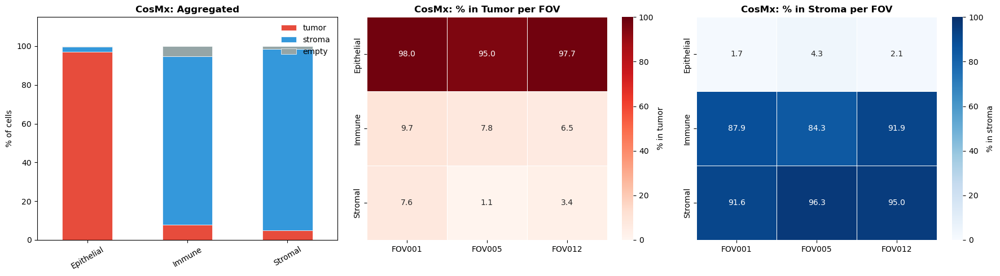

In [10]:
def plot_cell_compartment_distribution(cell_df, output_path=None, title_prefix="", colors=None):
    if colors is None:
        colors = {'tumor': '#e74c3c', 'stroma': '#3498db', 'empty': '#95a5a6'}

    df = cell_df[cell_df['gridgene_compartment'].isin(['tumor', 'stroma', 'empty'])].copy()

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # --- Panel 1: Aggregated stacked bar ---
    agg = df.groupby(['group', 'gridgene_compartment']).size().unstack(fill_value=0)
    agg = agg.div(agg.sum(axis=1), axis=0) * 100
    agg[['tumor', 'stroma', 'empty']].plot(
        kind='bar', stacked=True, ax=axes[0],
        color=[colors['tumor'], colors['stroma'], colors['empty']],
        edgecolor='white', linewidth=0.5
    )
    axes[0].set_title(f'{title_prefix}Aggregated', fontweight='bold')
    axes[0].set_ylabel('% of cells')
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=30)
    axes[0].legend(title='', frameon=False, loc='upper right')
    axes[0].set_ylim(0, 115)

    # --- Panel 2: % in tumor heatmap ---
    fov_pct = df.groupby(['fov', 'group', 'gridgene_compartment']).size().unstack(fill_value=0)
    fov_pct = fov_pct.div(fov_pct.sum(axis=1), axis=0) * 100
    fov_pct = fov_pct.reset_index()

    tumor_pct = fov_pct.pivot(index='group', columns='fov', values='tumor')
    stroma_pct = fov_pct.pivot(index='group', columns='fov', values='stroma')

    sns.heatmap(tumor_pct, annot=True, fmt='.1f', cmap='Reds',
                vmin=0, vmax=100, ax=axes[1],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in tumor'})
    axes[1].set_title(f'{title_prefix}% in Tumor per FOV', fontweight='bold')
    axes[1].set_xlabel('')
    axes[1].set_ylabel('')

    # --- Panel 3: % in stroma heatmap ---
    sns.heatmap(stroma_pct, annot=True, fmt='.1f', cmap='Blues',
                vmin=0, vmax=100, ax=axes[2],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in stroma'})
    axes[2].set_title(f'{title_prefix}% in Stroma per FOV', fontweight='bold')
    axes[2].set_xlabel('')
    axes[2].set_ylabel('')

    plt.tight_layout()
    if output_path:
        plt.savefig(output_path, dpi=500, bbox_inches='tight')
    plt.show()
    
plot_cell_compartment_distribution(cell_df, output_path=f'{OUTPUT_DIR}/cosmx_cell_metrics.png', title_prefix='CosMx: ', colors=None)

Visualize the comsx phenotype vs assignment of gridgene. It uses the centroids. 

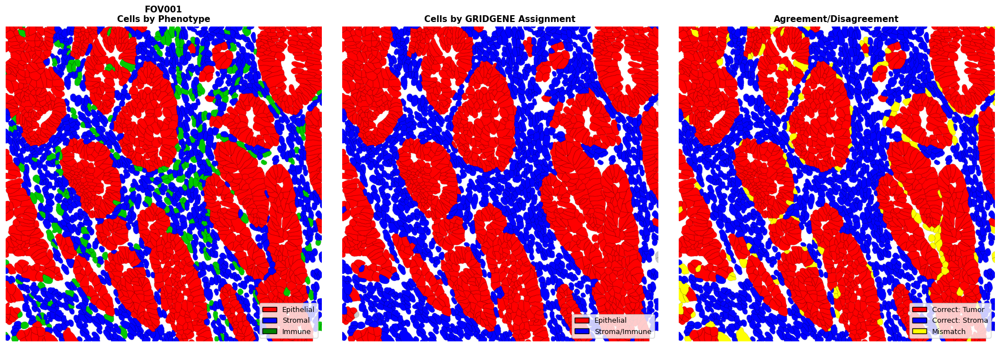


FOV001 - Cell-Level Validation Statistics:
✓ Correct: 2580/2714 (95.1%)
  - Epithelial in Tumor:  1398
  - Stroma/Immune in Stroma: 1182
✗ Mismatches: 134/2714 (4.9%)
  - Epithelial wrongly in Stroma: 26
  - Stroma/Immune wrongly in Tumor: 108


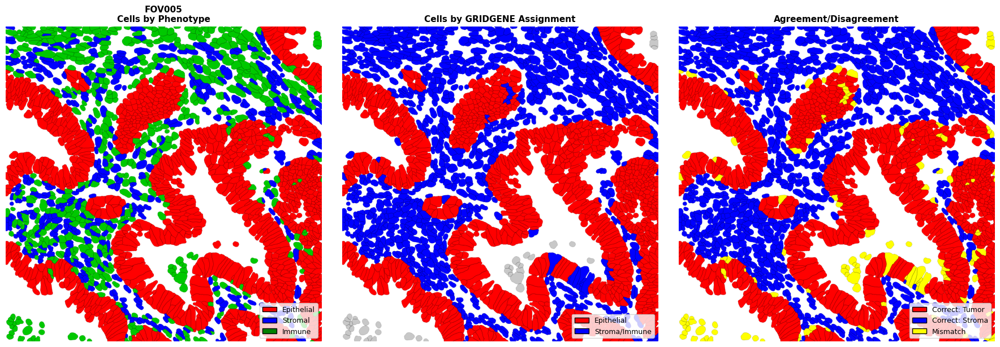


FOV005 - Cell-Level Validation Statistics:
✓ Correct: 1948/2084 (93.5%)
  - Epithelial in Tumor:  1002
  - Stroma/Immune in Stroma: 946
✗ Mismatches: 136/2084 (6.5%)
  - Epithelial wrongly in Stroma: 48
  - Stroma/Immune wrongly in Tumor: 88


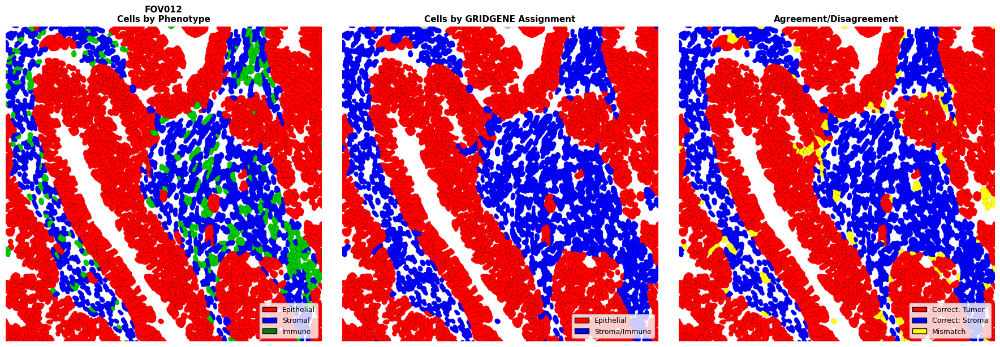


FOV012 - Cell-Level Validation Statistics:
✓ Correct: 2785/2871 (97.0%)
  - Epithelial in Tumor:  1779
  - Stroma/Immune in Stroma: 1006
✗ Mismatches: 86/2871 (3.0%)
  - Epithelial wrongly in Stroma: 41
  - Stroma/Immune wrongly in Tumor: 45


In [11]:
# def visualize_cosmx_phenotype_vs_gridgene(result, pheno_df, fov_data, save_path=None):
#     from scipy import ndimage
#     from skimage.segmentation import find_boundaries

#     fov_name = result['fov']
#     fov_num = int(fov_name.replace('FOV', ''))
#     mask_tumor = result['mask_tumor']
#     mask_stroma = result['mask_stroma']
#     h, w = mask_tumor.shape

#     cell_labels = tiff.imread(fov_data[fov_name]['cell_labels_path'])
#     cell_labels = np.rot90(np.flipud(cell_labels), -1)[:h, :w]

#     pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'group']].dropna()

#     cell_ids = pheno_fov['cell_id'].values
#     centroids = ndimage.center_of_mass(np.ones_like(cell_labels), cell_labels, index=cell_ids)

#     def get_gg(c):
#         xi, yi = int(round(c[0])), int(round(c[1]))
#         if xi < 0 or yi < 0 or xi >= h or yi >= w:
#             return 'none'
#         if mask_tumor[xi, yi] == 1:
#             return 'Epithelial'
#         elif mask_stroma[xi, yi] == 1:
#             return 'Stroma'
#         return 'none'

#     gg_map = {cid: get_gg(c) for cid, c in zip(cell_ids, centroids)}
#     group_map = dict(zip(pheno_fov['cell_id'], pheno_fov['group']))

#     color_map_pheno = {'Epithelial': (255, 0, 0), 'Stromal': (0, 0, 255), 'Immune': (0, 200, 0)}
#     max_id = cell_labels.max() + 1

#     lut_pheno = np.ones((max_id, 3), dtype=np.uint8) * 255
#     lut_gg    = np.ones((max_id, 3), dtype=np.uint8) * 255
#     lut_agree = np.ones((max_id, 3), dtype=np.uint8) * 255

#     correct_tumor, correct_stroma, epi_in_stroma, stroma_in_tumor = 0, 0, 0, 0

#     for cid in cell_ids:
#         group = group_map.get(cid)
#         gg = gg_map.get(cid, 'none')
#         if pd.isna(group):
#             continue
#         pheno_binary = 'Epithelial' if group == 'Epithelial' else 'Stroma'
#         lut_pheno[cid] = color_map_pheno.get(group, (128, 128, 128))
#         lut_gg[cid] = (255, 0, 0) if gg == 'Epithelial' else (0, 0, 255) if gg == 'Stroma' else (200, 200, 200)
#         if pheno_binary == gg:
#             lut_agree[cid] = (255, 0, 0) if pheno_binary == 'Epithelial' else (0, 0, 255)
#             if pheno_binary == 'Epithelial': correct_tumor += 1
#             else: correct_stroma += 1
#         else:
#             lut_agree[cid] = (255, 255, 0)
#             if pheno_binary == 'Epithelial': epi_in_stroma += 1
#             else: stroma_in_tumor += 1

#     phenotype_img = lut_pheno[cell_labels]
#     gridgene_img  = lut_gg[cell_labels]
#     agreement_img = lut_agree[cell_labels]

#     borders = find_boundaries(cell_labels, mode='outer')
#     background = cell_labels == 0
#     for img in [phenotype_img, gridgene_img, agreement_img]:
#         img[background] = (255, 255, 255)
#         img[borders] = (0, 0, 0)

#     fig, axes = plt.subplots(1, 3, figsize=(18, 6))

#     axes[0].imshow(phenotype_img)
#     axes[0].set_title(f'{fov_name}\nCells by Phenotype', fontsize=11, fontweight='bold')
#     axes[0].axis('off')

#     axes[1].imshow(gridgene_img)
#     axes[1].set_title('Cells by GRIDGENE Assignment', fontsize=11, fontweight='bold')
#     axes[1].axis('off')

#     axes[2].imshow(agreement_img)
#     axes[2].set_title('Agreement/Disagreement', fontsize=11, fontweight='bold')
#     axes[2].axis('off')

#     axes[0].legend(handles=[
#         Patch(facecolor='red', edgecolor='black', label='Epithelial'),
#         Patch(facecolor='blue', edgecolor='black', label='Stromal'),
#         Patch(facecolor='green', edgecolor='black', label='Immune')
#     ], loc='lower right', fontsize=9, frameon=True)

#     axes[1].legend(handles=[
#         Patch(facecolor='red', edgecolor='black', label='Epithelial'),
#         Patch(facecolor='blue', edgecolor='black', label='Stroma/Immune')
#     ], loc='lower right', fontsize=9, frameon=True)

#     axes[2].legend(handles=[
#         Patch(facecolor='red', edgecolor='black', label='Correct: Tumor'),
#         Patch(facecolor='blue', edgecolor='black', label='Correct: Stroma'),
#         Patch(facecolor='yellow', edgecolor='black', label='Mismatch')
#     ], loc='lower right', fontsize=9, frameon=True)

#     plt.tight_layout()
#     if save_path:
#         plt.savefig(save_path, dpi=300, bbox_inches='tight')
#     plt.show()

#     total = correct_tumor + correct_stroma + epi_in_stroma + stroma_in_tumor
#     print(f"\n{fov_name} - Cell-Level Validation Statistics:")
#     print("=" * 60)
#     print(f"✓ Correct: {correct_tumor+correct_stroma}/{total} ({100*(correct_tumor+correct_stroma)/total:.1f}%)")
#     print(f"  - Epithelial in Tumor:  {correct_tumor}")
#     print(f"  - Stroma/Immune in Stroma: {correct_stroma}")
#     print(f"✗ Mismatches: {epi_in_stroma+stroma_in_tumor}/{total} ({100*(epi_in_stroma+stroma_in_tumor)/total:.1f}%)")
#     print(f"  - Epithelial wrongly in Stroma: {epi_in_stroma}")
#     print(f"  - Stroma/Immune wrongly in Tumor: {stroma_in_tumor}")
#     print("=" * 60)


# for result in cosmx_results:
#     fov_name = result['fov']
#     visualize_cosmx_phenotype_vs_gridgene(result, pheno_df, fov_data,
#                                           save_path=f'{OUTPUT_DIR}/cosmx_agreement_{fov_name}.png')

# per pixxel and not per centorid! 
def visualize_cosmx_phenotype_vs_gridgene(result, pheno_df, fov_data, save_path=None):
    from skimage.segmentation import find_boundaries

    fov_name = result['fov']
    fov_num = int(fov_name.replace('FOV', ''))
    mask_tumor = result['mask_tumor']
    mask_stroma = result['mask_stroma']
    h, w = mask_tumor.shape

    cell_labels = tiff.imread(fov_data[fov_name]['cell_labels_path'])
    cell_labels = np.rot90(np.flipud(cell_labels), -1)[:h, :w]

    pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'group']].dropna()
    cell_ids = pheno_fov['cell_id'].values
    group_map = dict(zip(pheno_fov['cell_id'], pheno_fov['group']))

    # Pixel overlap assignment
    max_id = cell_labels.max() + 1
    tumor_pixels  = np.bincount(cell_labels.ravel(), weights=mask_tumor.ravel(),  minlength=max_id)
    stroma_pixels = np.bincount(cell_labels.ravel(), weights=mask_stroma.ravel(), minlength=max_id)

    def get_gg(cid):
        t, s = tumor_pixels[cid], stroma_pixels[cid]
        if t == 0 and s == 0:
            return 'none'
        return 'Epithelial' if t >= s else 'Stroma'

    gg_map = {cid: get_gg(cid) for cid in cell_ids}

    color_map_pheno = {'Epithelial': (255, 0, 0), 'Stromal': (0, 0, 255), 'Immune': (0, 200, 0)}

    lut_pheno = np.ones((max_id, 3), dtype=np.uint8) * 255
    lut_gg    = np.ones((max_id, 3), dtype=np.uint8) * 255
    lut_agree = np.ones((max_id, 3), dtype=np.uint8) * 255

    correct_tumor, correct_stroma, epi_in_stroma, stroma_in_tumor = 0, 0, 0, 0

    for cid in cell_ids:
        group = group_map.get(cid)
        gg = gg_map.get(cid, 'none')
        if pd.isna(group):
            continue
        pheno_binary = 'Epithelial' if group == 'Epithelial' else 'Stroma'
        lut_pheno[cid] = color_map_pheno.get(group, (128, 128, 128))
        lut_gg[cid] = (255, 0, 0) if gg == 'Epithelial' else (0, 0, 255) if gg == 'Stroma' else (200, 200, 200)
        if pheno_binary == gg:
            lut_agree[cid] = (255, 0, 0) if pheno_binary == 'Epithelial' else (0, 0, 255)
            if pheno_binary == 'Epithelial': correct_tumor += 1
            else: correct_stroma += 1
        else:
            lut_agree[cid] = (255, 255, 0)
            if pheno_binary == 'Epithelial': epi_in_stroma += 1
            else: stroma_in_tumor += 1

    phenotype_img = lut_pheno[cell_labels]
    gridgene_img  = lut_gg[cell_labels]
    agreement_img = lut_agree[cell_labels]

    borders = find_boundaries(cell_labels, mode='outer')
    background = cell_labels == 0
    for img in [phenotype_img, gridgene_img, agreement_img]:
        img[background] = (255, 255, 255)
        img[borders] = (0, 0, 0)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(phenotype_img)
    axes[0].set_title(f'{fov_name}\nCells by Phenotype', fontsize=11, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(gridgene_img)
    axes[1].set_title('Cells by GRIDGENE Assignment', fontsize=11, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(agreement_img)
    axes[2].set_title('Agreement/Disagreement', fontsize=11, fontweight='bold')
    axes[2].axis('off')

    axes[0].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Epithelial'),
        Patch(facecolor='blue', edgecolor='black', label='Stromal'),
        Patch(facecolor='green', edgecolor='black', label='Immune')
    ], loc='lower right', fontsize=9, frameon=True)

    axes[1].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Epithelial'),
        Patch(facecolor='blue', edgecolor='black', label='Stroma/Immune')
    ], loc='lower right', fontsize=9, frameon=True)

    axes[2].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Correct: Tumor'),
        Patch(facecolor='blue', edgecolor='black', label='Correct: Stroma'),
        Patch(facecolor='yellow', edgecolor='black', label='Mismatch')
    ], loc='lower right', fontsize=9, frameon=True)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    total = correct_tumor + correct_stroma + epi_in_stroma + stroma_in_tumor
    print(f"\n{fov_name} - Cell-Level Validation Statistics:")
    print("=" * 60)
    print(f"✓ Correct: {correct_tumor+correct_stroma}/{total} ({100*(correct_tumor+correct_stroma)/total:.1f}%)")
    print(f"  - Epithelial in Tumor:  {correct_tumor}")
    print(f"  - Stroma/Immune in Stroma: {correct_stroma}")
    print(f"✗ Mismatches: {epi_in_stroma+stroma_in_tumor}/{total} ({100*(epi_in_stroma+stroma_in_tumor)/total:.1f}%)")
    print(f"  - Epithelial wrongly in Stroma: {epi_in_stroma}")
    print(f"  - Stroma/Immune wrongly in Tumor: {stroma_in_tumor}")
    print("=" * 60)


for result in cosmx_results:
    fov_name = result['fov']
    visualize_cosmx_phenotype_vs_gridgene(result, pheno_df, fov_data,
                                          save_path=f'{OUTPUT_DIR}/cosmx_agreement_{fov_name}.png')

## Xenium

We will now do the same quantitative analysis but this time with Xenium data. Importantly we only have 3 cores matching Imaging Mass Cytometry (IMC) experiments. We will 
    - (1) Run gridgene pipeline on Xenium;
    - (2) Fetch cell segmentation (done with Baysor - https://doi.org/10.1038/s41587-021-01044-w) and phenotyping.

Importantly, the overlay between both images would depend on the parametes used in gridgene, meaning, depending on the degree of details, masks can become more smooth or more fine grained.

Define Paths

In [12]:
# ============================================================================
# XENIUM + IMC CONFIGURATION
# ============================================================================

# Base paths
xenium_base_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium_data/HLA/GD_TMA1_S3/fov_filtered'

imc_base_path = "/home/martinha/PycharmProjects/phd/spatial_transcriptomics/GRIDGEN/case_studies/PENGUINcompositesIMC"
baysor_base_path_xenium = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium/HLA_analysis/cell_segmentation/cells_prior07'

# Shared files (same for all ROIs)
phenotype_h5ad_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium/HLA_analysis/cell_prior07_v20_03.h5ad'
selection_coords_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium_data/HLA/GD_TMA1_S3/coordinates_HLA1.csv'

# ROI to Selection mapping
roi_to_selection = {
    'ROI001': 'Selection8',
    'ROI002': 'Selection32',
    'ROI003': 'Selection13'
}

# Build the ROI data dictionary
roi_data = {
    'ROI001': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection8_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI001_ROI_001.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection8'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection8', 'segmentation_polygons.json'),
        'selection_name': 'Selection8'
    },
    'ROI002': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection32_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI002_ROI_002.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection32'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection32', 'segmentation_polygons.json'),
        'selection_name': 'Selection32'
    },
    'ROI003': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection13_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI003_ROI_003.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection13'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection13', 'segmentation_polygons.json'),
        'selection_name': 'Selection13'
    }
}

### 2.1. Run gridgene

In [13]:
def do_xenium_pipeline(file_csv, target_tum, 
                     kernel_size_tum, density_th_tum, min_area_th_tum,
                     kernel_size_empty, density_th_empty, min_area_th_empty,
                     plot=False):
    """
    Generate GRIDGENE masks from CosMx CSV file
    
    Returns:
    --------
    dict: Contains masks and metadata
        - 'mask_tumor': tumor mask
        - 'mask_stroma': stroma mask  
        - 'mask_empty': empty mask
        - 'height': image height
        - 'width': image width
        - 'fov': FOV identifier
        - 'filename': input CSV filename
    """
    
    # Load and prepare data   --- only this part is different from CosMx join both 
    df_total = pd.read_csv(file_csv)
    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])
    
    n_genes = len(df_total['target'].unique())
    height = int(max(df_total['X'])) + 1
    width = int(max(df_total['Y'])) + 1
    
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    
    # Create array
    array_total = ga.transform_df_to_array(
        df=df_total, 
        target_dict=target_dict_total, 
        array_shape=(height, width, len(target_dict_total))
    ).astype(np.int8)
    
    # Subset for tumor markers
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(
        df_total, array_total, target_dict_total,
        target_list=target_tum, target_col='target'
    )
    
    # Tumor contours
    CTum = contours.ConvolutionContours(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(
        density_threshold=density_th_tum,
        min_area_threshold=min_area_th_tum,
        directionality='higher'
    )
    
    # Empty region contours
    CEmpty = contours.ConvolutionContours(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(
        density_threshold=density_th_empty,
        min_area_threshold=min_area_th_empty,
        directionality='lower'
    )
    
    # Create masks
    GM = get_masks.GetMasks(image_shape=(height, width))
    
    mask_empty = GM.create_mask(CEmpty.contours)
    mask_tum = GM.create_mask(CTum.contours)
    mask_tum = GM.fill_holes(mask_tum)
    mask_stroma = GM.subtract_masks(
        np.ones((height, width), dtype=np.uint8), 
        mask_tum, 
        mask_empty
    )
    mask_stroma = GM.filter_binary_mask_by_area(mask_stroma, min_area=700)
    
    basename = os.path.basename(file_csv)
    fov_match = re.search(r'FOV\d{3}', basename)
    fov = fov_match.group(0) if fov_match else basename.split('_')[0]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        
        CTum.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[0]
        )
        axs[0].set_title(f'{fov}: Tumor Contours')
        
        CEmpty.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[1]
        )
        axs[1].set_title(f'{fov}: Empty Region Contours')
        
        GM.plot_masks(
            masks=[mask_stroma, mask_tum], 
            mask_names=['Stroma', 'Tumor'],
            background_color=(1, 1, 1), 
            mask_colors={'Stroma': (65, 105, 225), 'Tumor': (255, 165, 0)},
            path=None, show=False, ax=axs[2]
        )
        axs[2].set_title(f'{fov}: Final Masks')
        
        plt.tight_layout()
        plt.show()
    
    # Return dictionary with all info
    return {
        'mask_tumor': mask_tum,
        'mask_stroma': mask_stroma,
        'mask_empty': mask_empty,
        'height': height,
        'width': width,
        'filename': file_csv
    }


Processing ROI001...


2026-03-14 00:01:10,605 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-14 00:01:10,657 - gridgene.contours.tum - INFO - get_conv_sum took 0.0522 seconds
2026-03-14 00:01:10,703 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 14
2026-03-14 00:01:10,704 - gridgene.contours.tum - INFO - contours_from_sum took 0.0461 seconds
2026-03-14 00:01:10,704 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-14 00:01:11,194 - gridgene.contours.empty - INFO - get_conv_sum took 0.4901 seconds
2026-03-14 00:01:11,666 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 3
2026-03-14 00:01:11,666 - gridgene.contours.empty - INFO - contours_from_sum took 0.4716 seconds
2026-03-14 00:01:11,667 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-14 00:01:11,670 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


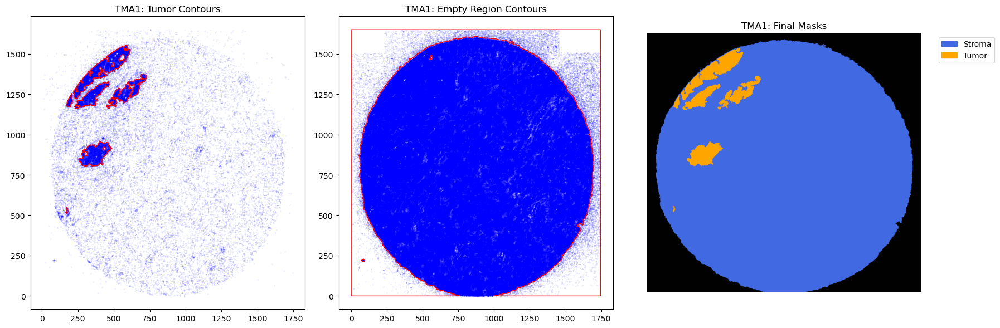

 Completed ROI001

Processing ROI002...


2026-03-14 00:01:14,656 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-14 00:01:14,710 - gridgene.contours.tum - INFO - get_conv_sum took 0.0541 seconds
2026-03-14 00:01:14,755 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 2
2026-03-14 00:01:14,755 - gridgene.contours.tum - INFO - contours_from_sum took 0.0446 seconds
2026-03-14 00:01:14,756 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-14 00:01:15,373 - gridgene.contours.empty - INFO - get_conv_sum took 0.6171 seconds
2026-03-14 00:01:15,999 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 237
2026-03-14 00:01:15,999 - gridgene.contours.empty - INFO - contours_from_sum took 0.6257 seconds
2026-03-14 00:01:15,999 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-14 00:01:16,005 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


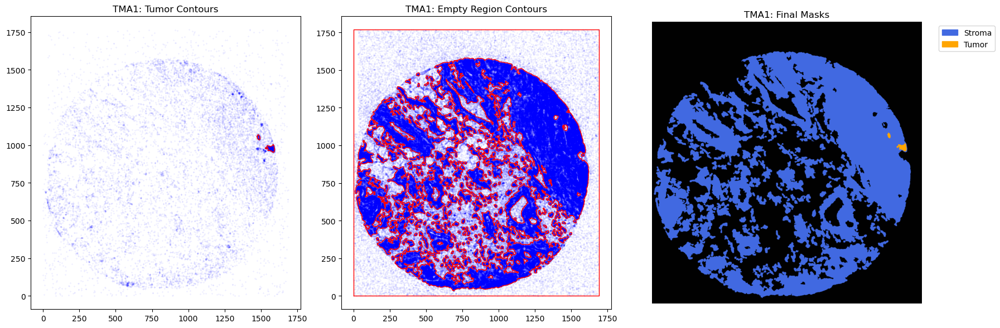

 Completed ROI002

Processing ROI003...


2026-03-14 00:01:23,347 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-14 00:01:23,413 - gridgene.contours.tum - INFO - get_conv_sum took 0.0652 seconds
2026-03-14 00:01:23,485 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 68
2026-03-14 00:01:23,485 - gridgene.contours.tum - INFO - contours_from_sum took 0.0725 seconds
2026-03-14 00:01:23,486 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-14 00:01:24,159 - gridgene.contours.empty - INFO - get_conv_sum took 0.6722 seconds
2026-03-14 00:01:24,844 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 34
2026-03-14 00:01:24,845 - gridgene.contours.empty - INFO - contours_from_sum took 0.6860 seconds
2026-03-14 00:01:24,845 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-14 00:01:24,854 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


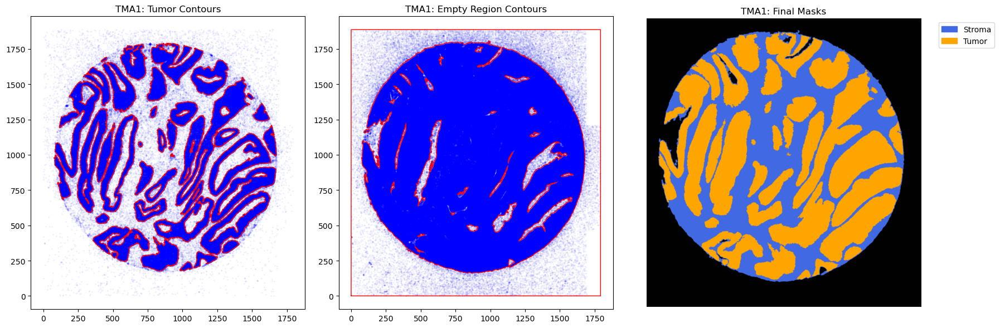

 Completed ROI003


In [14]:
############## DEFINE PARAMETERS ##################

# param tum
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 
# density_th_tum = 20    # 50
# min_area_th_tum =  700 #1000     check how much is a cell 
# kernel_size_tum = 10   # 20

# # param empty
# density_th_empty = 30
# min_area_th_empty = 400 #400
# kernel_size_empty = 10

density_th_tum = 5    # 50
min_area_th_tum =  200 #1000     check how much is a cell 
kernel_size_tum = 5   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 200 #400
kernel_size_empty = 10

############# RUN GRIDGENE ###################
xenium_results = {}
for fov_name, paths in roi_data.items():
    print(f"\nProcessing {fov_name}...")
    
    result = do_xenium_pipeline(
        paths['xenium_path'],
        target_tum, 
        kernel_size_tum, density_th_tum, min_area_th_tum,
        kernel_size_empty, density_th_empty, min_area_th_empty,
        plot=True
    )

    result['fov'] = fov_name
    
    xenium_results[fov_name] = result
    print(f" Completed {fov_name}")

### 2.2 Compare Gridgene masks with cell segmentation

In [15]:
OUTPUT_DIR = 'figures/xenium'
os.makedirs(OUTPUT_DIR, exist_ok=True)

map cells to gridgene masks

In [19]:

# Load AnnData and coordinates
adata = sc.read_h5ad(phenotype_h5ad_path)
# Create Xenium compartment mapping
COMPARTMENT_MAPPING_XENIUM = {
    'Epithelial': 'tumor',
    'Stroma-Fibroblasts': 'stroma',
    'Stroma-Myofibroblasts_vsmc': 'stroma',
    'Stroma-Tip-vascular': 'stroma',
    'Stroma-Pericytes': 'stroma',
    'Stroma-Glia': 'stroma',
    'Immune-Myeloid': 'immune',
    'Immune-Tcell': 'immune',
    'Immune-PlasmaB': 'immune',
    'Immune-Bcell': 'immune',
    'Immune-undefined': 'immune',
    'Immune-contaminated': 'other',
}

# Apply mapping
adata.obs['compartment'] = adata.obs['annotation_level2'].map(COMPARTMENT_MAPPING_XENIUM)
adata.obs['cellID'] = adata.obs['Name'].str.split('-').str[1].astype(int)

# Extract numeric cell ID from Name
adata.obs['cell_id_numeric'] = adata.obs['Name'].str.split('-').str[1].astype(int)
adata_selection = adata[adata.obs['TMA']=='TMA1']
print(len(adata_selection))
coordinates_all = pd.read_csv(selection_coords_path)

# Process all ROIs
cell_phenotype_results = {}

for roi_name, paths in roi_data.items():
    print(f"{roi_name}...", end=" ")
    
    if paths['baysor_json'] is None:
        print("✗ No Baysor data")
        continue
    
    try:
        # Get coordinate offsets
        selection_num = paths['selection_name'].replace('Selection', '').strip()
        coords = coordinates_all[coordinates_all['Selection'] == f'Selection {selection_num}']
        min_x = coords['X'].min()
        min_y = coords['Y'].min()

        adata_selection_ = adata_selection[adata_selection.obs['Selection'] == f'Selection {selection_num}']
        # Load polygons
        polygons = load_baysor_polygons(paths['baysor_folder'])
        
        # Map phenotypes with coordinate shifting
        cell_phenotypes = map_phenotypes_to_polygons_xenium(
            polygons, 
            adata_selection_, 
            paths['selection_name'],
            min_x,
            min_y
        )
        
        cell_phenotype_results[roi_name] = {
            'success': True,
            'cell_phenotypes': cell_phenotypes,
            'n_cells': len(cell_phenotypes)
        }
        
        print(f"✓ {len(cell_phenotypes)} cells")
        
    except Exception as e:
        print(f"✗ {e}")
        cell_phenotype_results[roi_name] = {'success': False} 

326342
ROI001...   (68 polygons skipped) ✓ 7344 cells
ROI002...   (53 polygons skipped) ✓ 7551 cells
ROI003...   (237 polygons skipped) ✓ 19691 cells


In [20]:
def map_cells_to_gridgene_masks_xenium(cell_phenotype_results, xenium_results_transformed):
    all_results = []
    
    for roi_name, result in cell_phenotype_results.items():
        if not result.get('success', False):
            continue
        
        cell_phenotypes = result['cell_phenotypes'].copy()
        mask_tumor  = xenium_results_transformed[roi_name]['mask_tumor']
        mask_stroma = xenium_results_transformed[roi_name]['mask_stroma']
        image_shape = mask_tumor.shape
        
        rows = []
        for _, row in cell_phenotypes.iterrows():
            if pd.isna(row['compartment']):
                continue
            
            # Pixel overlap via polygon rasterization
            coords = np.array(row['polygon'].exterior.coords, dtype=np.int32)
            cell_mask = np.zeros(image_shape, dtype=np.uint8)
            cv2.fillPoly(cell_mask, [coords], 1)
            
            t = (cell_mask & mask_tumor.astype(np.uint8)).sum()
            s = (cell_mask & mask_stroma.astype(np.uint8)).sum()
            
            if t == 0 and s == 0:
                gridgene_compartment = 'unassigned'
            else:
                gridgene_compartment = 'tumor' if t >= s else 'stroma'
            
            # Map compartment to group
            comp = row['compartment']
            if comp == 'tumor':
                group = 'Epithelial'
            elif comp == 'stroma':
                group = 'Stromal'
            elif comp == 'immune':
                group = 'Immune'
            else:
                group = None  # skip anything unexpected#'Other'
            
            rows.append({'fov': roi_name, 'group': group, 'gridgene_compartment': gridgene_compartment})
        
        all_results.extend(rows)
        print(f"{roi_name}: {len(rows)} cells ✓")
    
    return pd.DataFrame(all_results)

cell_df_xenium = map_cells_to_gridgene_masks_xenium(cell_phenotype_results, xenium_results_transformed)
print(cell_df_xenium['gridgene_compartment'].value_counts())
print(pd.crosstab(cell_df_xenium['group'], cell_df_xenium['gridgene_compartment'], normalize='index').round(2))

ROI001: 7344 cells ✓
ROI002: 7551 cells ✓
ROI003: 19691 cells ✓
gridgene_compartment
stroma        20827
tumor         13484
unassigned      275
Name: count, dtype: int64
gridgene_compartment  stroma  tumor  unassigned
group                                          
Epithelial              0.01   0.99        0.00
Immune                  0.92   0.06        0.01
Stromal                 0.98   0.01        0.01


In [21]:
df = cell_df_xenium[cell_df_xenium['gridgene_compartment'].isin(['tumor', 'stroma'])].copy()
df['correct'] = ((df['group'] == 'Epithelial') & (df['gridgene_compartment'] == 'tumor')) | \
                ((df['group'] != 'Epithelial') & (df['gridgene_compartment'] == 'stroma'))
concordance = df['correct'].sum() / len(df) * 100
print(f"Overall concordance: {concordance:.1f}%")

Overall concordance: 97.8%


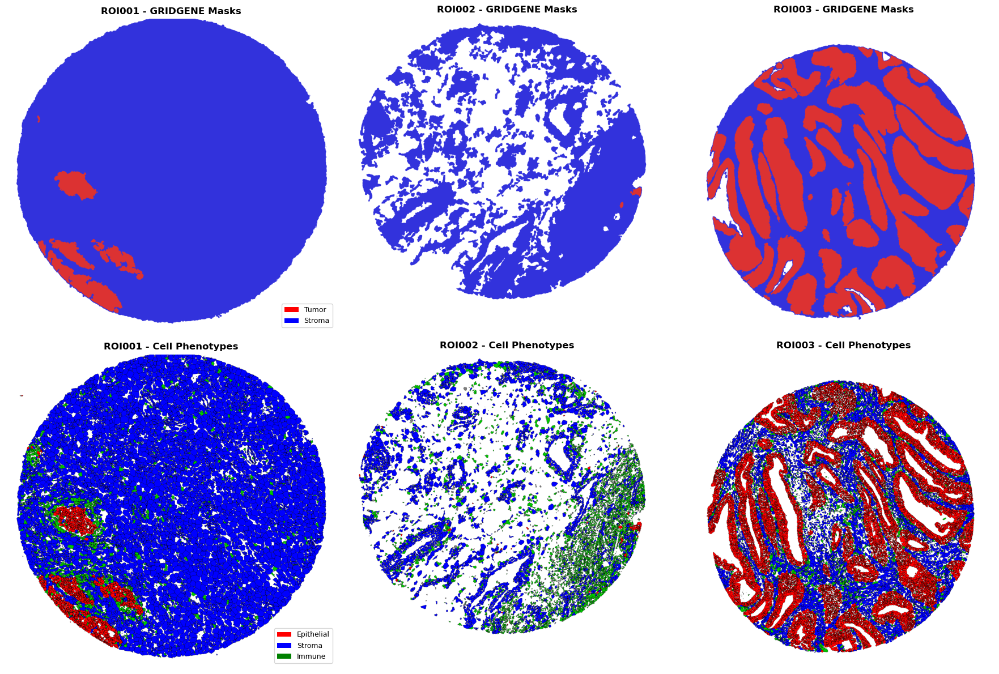

In [22]:
roi_names = ['ROI001', 'ROI002', 'ROI003']
n = len(roi_names)
fig, axes = plt.subplots(2, n, figsize=(6*n, 12))

colors = {'tumor': (255, 0, 0), 'stroma': (0, 0, 255), 'immune': (0, 200, 0)}

for idx, roi_name in enumerate(roi_names):
    gg = xenium_results_transformed[roi_name]
    mask_tumor = gg['mask_tumor']
    mask_stroma = gg['mask_stroma']
    h, w = mask_tumor.shape

    # Row 1: GRIDGENE masks
    gg_rgb = np.ones((h, w, 3), dtype=np.uint8) * 255
    gg_rgb[mask_tumor == 1] = (220, 50, 50)
    gg_rgb[mask_stroma == 1] = (50, 50, 220)
    axes[0, idx].imshow(gg_rgb)
    axes[0, idx].set_title(f'{roi_name} - GRIDGENE Masks', fontweight='bold')
    axes[0, idx].axis('off')

    # Row 2: Cell phenotypes
    if not cell_phenotype_results.get(roi_name, {}).get('success', False):
        axes[1, idx].text(0.5, 0.5, 'No data', ha='center', va='center')
        axes[1, idx].axis('off')
        continue

    cell_phenotypes = cell_phenotype_results[roi_name]['cell_phenotypes']
    cell_phenotype_img = np.ones((h, w, 3), dtype=np.uint8) * 255
    for _, row in cell_phenotypes.iterrows():
        if pd.isna(row['compartment']):
            continue
        color = colors.get(row['compartment'], (128, 128, 128))
        coords = np.array(row['polygon'].exterior.coords, dtype=np.int32)
        cv2.fillPoly(cell_phenotype_img, [coords], color)
        cv2.polylines(cell_phenotype_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)

    axes[1, idx].imshow(cell_phenotype_img)
    axes[1, idx].set_title(f'{roi_name} - Cell Phenotypes', fontweight='bold')
    axes[1, idx].axis('off')

legend_gg = [Patch(facecolor='red', label='Tumor'), Patch(facecolor='blue', label='Stroma')]
axes[0, 0].legend(handles=legend_gg, loc='lower right', fontsize=9)

legend_ph = [Patch(facecolor='red', label='Epithelial'),
             Patch(facecolor='blue', label='Stroma'),
             Patch(facecolor='green', label='Immune')]
axes[1, 0].legend(handles=legend_ph, loc='lower right', fontsize=9)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/xenium_overview.png', dpi=300, bbox_inches='tight')
plt.show()

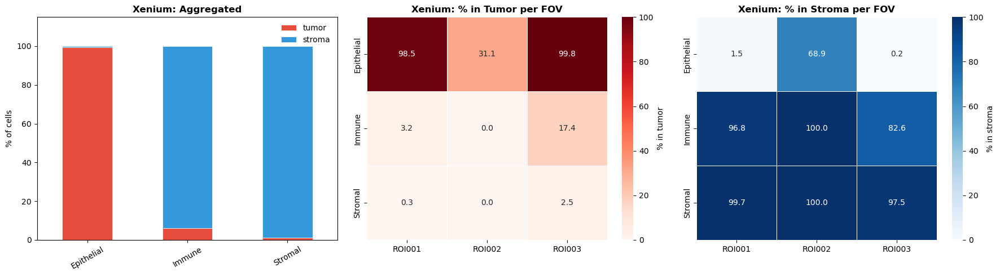

In [23]:
def plot_cell_compartment_distribution(cell_df, output_path=None, title_prefix="", colors=None):
    if colors is None:
        colors = {'tumor': '#e74c3c', 'stroma': '#3498db', 'empty': '#95a5a6'}

    df = cell_df[cell_df['gridgene_compartment'].isin(['tumor', 'stroma', 'empty'])].copy()

    # Only use compartment columns that actually exist
    available = [c for c in ['tumor', 'stroma', 'empty'] if c in df['gridgene_compartment'].unique()]
    plot_colors = [colors[c] for c in available]

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    agg = df.groupby(['group', 'gridgene_compartment']).size().unstack(fill_value=0)
    agg = agg.div(agg.sum(axis=1), axis=0) * 100
    agg[available].plot(kind='bar', stacked=True, ax=axes[0],
                        color=plot_colors, edgecolor='white', linewidth=0.5)
    axes[0].set_title(f'{title_prefix}Aggregated', fontweight='bold')
    axes[0].set_ylabel('% of cells')
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=30)
    axes[0].legend(title='', frameon=False, loc='upper right')
    axes[0].set_ylim(0, 115)

    fov_pct = df.groupby(['fov', 'group', 'gridgene_compartment']).size().unstack(fill_value=0)
    fov_pct = fov_pct.div(fov_pct.sum(axis=1), axis=0) * 100
    fov_pct = fov_pct.reset_index()

    tumor_pct  = fov_pct.pivot(index='group', columns='fov', values='tumor')  if 'tumor'  in fov_pct.columns else None
    stroma_pct = fov_pct.pivot(index='group', columns='fov', values='stroma') if 'stroma' in fov_pct.columns else None

    if tumor_pct is not None:
        sns.heatmap(tumor_pct, annot=True, fmt='.1f', cmap='Reds',
                    vmin=0, vmax=100, ax=axes[1],
                    linewidths=0.5, linecolor='white',
                    cbar_kws={'label': '% in tumor'})
        axes[1].set_title(f'{title_prefix}% in Tumor per FOV', fontweight='bold')
        axes[1].set_xlabel('')
        axes[1].set_ylabel('')

    if stroma_pct is not None:
        sns.heatmap(stroma_pct, annot=True, fmt='.1f', cmap='Blues',
                    vmin=0, vmax=100, ax=axes[2],
                    linewidths=0.5, linecolor='white',
                    cbar_kws={'label': '% in stroma'})
        axes[2].set_title(f'{title_prefix}% in Stroma per FOV', fontweight='bold')
        axes[2].set_xlabel('')
        axes[2].set_ylabel('')

    plt.tight_layout()
    if output_path:
        plt.savefig(output_path, dpi=500, bbox_inches='tight')
    plt.show()

plot_cell_compartment_distribution(cell_df_xenium, output_path=f'{OUTPUT_DIR}/xenium_cell_metrics.png', title_prefix='Xenium: ', colors=None)

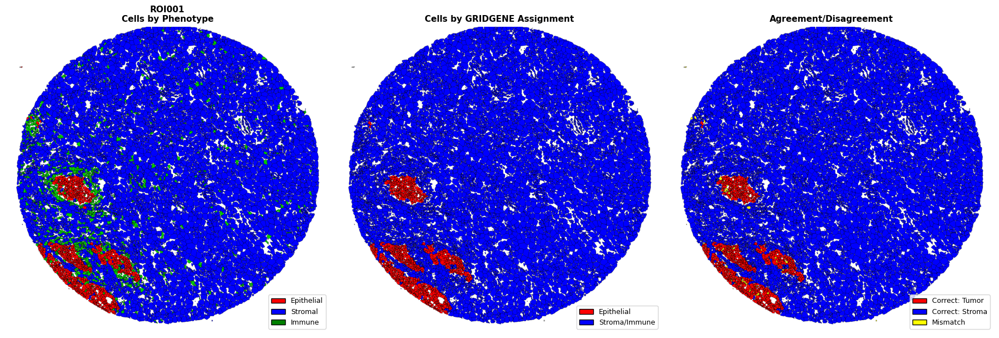


ROI001 - Cell-Level Validation Statistics:
✓ Correct: 7250/7319 (99.1%)
  - Epithelial in Tumor:  852
  - Stroma/Immune in Stroma: 6398
✗ Mismatches: 69/7319 (0.9%)
  - Epithelial wrongly in Stroma: 14
  - Stroma/Immune wrongly in Tumor: 55


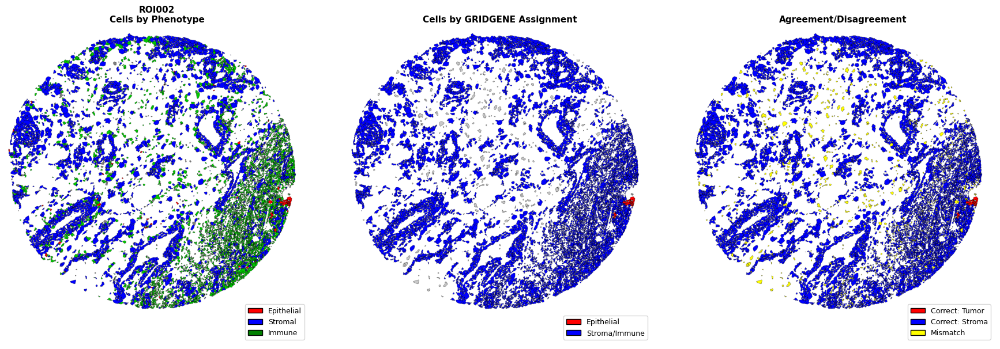


ROI002 - Cell-Level Validation Statistics:
✓ Correct: 6620/6889 (96.1%)
  - Epithelial in Tumor:  23
  - Stroma/Immune in Stroma: 6597
✗ Mismatches: 269/6889 (3.9%)
  - Epithelial wrongly in Stroma: 56
  - Stroma/Immune wrongly in Tumor: 213


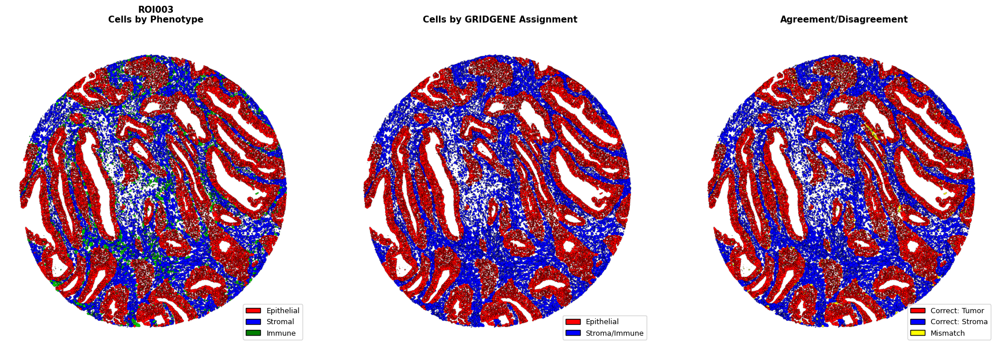


ROI003 - Cell-Level Validation Statistics:
✓ Correct: 18960/19530 (97.1%)
  - Epithelial in Tumor:  11932
  - Stroma/Immune in Stroma: 7028
✗ Mismatches: 570/19530 (2.9%)
  - Epithelial wrongly in Stroma: 29
  - Stroma/Immune wrongly in Tumor: 541


In [24]:
def visualize_xenium_phenotype_vs_gridgene(roi_name, save_path=None):

    if not cell_phenotype_results[roi_name].get('success', False):
        print(f"{roi_name}: No cell data")
        return

    cell_phenotypes = cell_phenotype_results[roi_name]['cell_phenotypes']
    gg_tumor = xenium_results_transformed[roi_name]['mask_tumor']
    gg_stroma = xenium_results_transformed[roi_name]['mask_stroma']
    image_shape = gg_tumor.shape

    correct_tumor, correct_stroma, epithelial_in_stroma, stroma_in_tumor = 0, 0, 0, 0

    phenotype_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    gridgene_img  = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    agreement_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255

    for _, row in cell_phenotypes.iterrows():
        coords = np.array(row['polygon'].exterior.coords, dtype=np.int32)
        compartment = row['compartment']
        if pd.isna(compartment):
            continue

        # Phenotype binary (for agreement logic)
        if compartment == 'tumor':
            phenotype_binary = 'Epithelial'
        elif compartment in ('stroma', 'immune'):
            phenotype_binary = 'Stroma'
        else:
            phenotype_binary = 'other'

        # Pixel overlap for GRIDGENE assignment
        cell_mask = np.zeros(image_shape, dtype=np.uint8)
        cv2.fillPoly(cell_mask, [coords], 1)
        t = (cell_mask & gg_tumor.astype(np.uint8)).sum()
        s = (cell_mask & gg_stroma.astype(np.uint8)).sum()
        if t > s:
            gridgene_assignment = 'Epithelial'
        elif s > t:
            gridgene_assignment = 'Stroma'
        else:
            gridgene_assignment = 'none'

        # Column 1: phenotype color (tumor/stroma/immune separately)
        if compartment == 'tumor':
            phenotype_color = (255, 0, 0)
        elif compartment == 'stroma':
            phenotype_color = (0, 0, 255)
        elif compartment == 'immune':
            phenotype_color = (0, 200, 0)
        else:
            phenotype_color = (128, 128, 128)
        cv2.fillPoly(phenotype_img, [coords], phenotype_color)
        cv2.polylines(phenotype_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)

        # Column 2: GRIDGENE assignment
        gridgene_color = (255, 0, 0) if gridgene_assignment == 'Epithelial' else \
                         (0, 0, 255) if gridgene_assignment == 'Stroma' else (200, 200, 200)
        cv2.fillPoly(gridgene_img, [coords], gridgene_color)
        cv2.polylines(gridgene_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)

        # Column 3: agreement
        if phenotype_binary == gridgene_assignment:
            agreement_color = (255, 0, 0) if phenotype_binary == 'Epithelial' else (0, 0, 255)
            if phenotype_binary == 'Epithelial': correct_tumor += 1
            else: correct_stroma += 1
        else:
            agreement_color = (255, 255, 0)
            if phenotype_binary == 'Epithelial': epithelial_in_stroma += 1
            elif phenotype_binary == 'Stroma': stroma_in_tumor += 1
        cv2.fillPoly(agreement_img, [coords], agreement_color)
        cv2.polylines(agreement_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(phenotype_img)
    axes[0].set_title(f'{roi_name}\nCells by Phenotype', fontsize=11, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(gridgene_img)
    axes[1].set_title('Cells by GRIDGENE Assignment', fontsize=11, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(agreement_img)
    axes[2].set_title('Agreement/Disagreement', fontsize=11, fontweight='bold')
    axes[2].axis('off')

    axes[0].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Epithelial'),
        Patch(facecolor='blue', edgecolor='black', label='Stromal'),
        Patch(facecolor='green', edgecolor='black', label='Immune')
    ], loc='lower right', fontsize=9, frameon=True)

    axes[1].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Epithelial'),
        Patch(facecolor='blue', edgecolor='black', label='Stroma/Immune')
    ], loc='lower right', fontsize=9, frameon=True)

    axes[2].legend(handles=[
        Patch(facecolor='red', edgecolor='black', label='Correct: Tumor'),
        Patch(facecolor='blue', edgecolor='black', label='Correct: Stroma'),
        Patch(facecolor='yellow', edgecolor='black', label='Mismatch')
    ], loc='lower right', fontsize=9, frameon=True)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    total = correct_tumor + correct_stroma + epithelial_in_stroma + stroma_in_tumor
    print(f"\n{roi_name} - Cell-Level Validation Statistics:")
    print("=" * 60)
    print(f"✓ Correct: {correct_tumor+correct_stroma}/{total} ({100*(correct_tumor+correct_stroma)/total:.1f}%)")
    print(f"  - Epithelial in Tumor:  {correct_tumor}")
    print(f"  - Stroma/Immune in Stroma: {correct_stroma}")
    print(f"✗ Mismatches: {epithelial_in_stroma+stroma_in_tumor}/{total} ({100*(epithelial_in_stroma+stroma_in_tumor)/total:.1f}%)")
    print(f"  - Epithelial wrongly in Stroma: {epithelial_in_stroma}")
    print(f"  - Stroma/Immune wrongly in Tumor: {stroma_in_tumor}")
    print("=" * 60)


for roi_name in ['ROI001', 'ROI002', 'ROI003']:
    if cell_phenotype_results.get(roi_name, {}).get('success', False):
        visualize_xenium_phenotype_vs_gridgene(
            roi_name,
            save_path=f'{OUTPUT_DIR}/xenium_agreement_{roi_name}.png'
        )